### Project Objectives

1. Evaluate the performance of AutoML tools (H2O AutoML, AutoGluon, etc.) in classifying eye states (open/closed) using EEG signals.  
2. Analyze the behavior of models generated without advanced preprocessing or manual feature engineering.  
3. Establish a baseline for identifying future improvement opportunities through data manipulation or parameter tuning.  

### Project Summary

This document represents an initial exploration of EEG data classification for eye state detection using AutoML frameworks. The primary objective is to assess the performance of these platforms in their default configurations, with no prior manipulation of the dataset or manual feature engineering. By doing so, this study aims to establish a baseline understanding of the inherent capabilities of AutoML tools when applied to raw data.  

The dataset used consists of EEG signals captured with the Emotiv EEG Neuroheadset and manually labeled to differentiate between eye-open and eye-closed states. The AutoML platforms were set up with minimal user intervention, relying on their automated capabilities for tasks such as feature selection, hyperparameter optimization, and model evaluation.  

Key performance metrics, including AUC, accuracy, F1-score, and precision, were analyzed to measure the models' effectiveness. Additionally, the study provides insights into the strengths and limitations of these tools when applied to real-world physiological data. The findings serve as a foundation for future iterations, where data preprocessing and advanced techniques can be introduced to enhance model performance.


In [1]:
%pip install mne
%pip install PyQt5
%pip install tabulate
%pip install nbformat
%pip install h2o
%pip install autogluon.tabular[all]
%pip install dask-expr
%pip install tpot


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: tabulate in c:\users\ahmed taha\appdata\local\programs\python\python310\lib\site-packages (0.9.0)




[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached autogluon.tabular-1.2-py3-none-any.whl.metadata (14 kB)
  Using cached autogluon.core-1.2-py3-none-any.whl.metadata (12 kB)
  Using cached autogluon.features-1.2-py3-none-any.whl.metadata (11 kB)
  Using cached catboost-1.2.7-cp310-cp310-win_amd64.whl.metadata (1.2 kB)
  Using cached spacy-3.7.5-cp310-cp310-win_amd64.whl.metadata (27 kB)
  Using cached lightgbm-4.5.0-py3-none-win_amd64.whl.metadata (17 kB)
  Using cached fastai-2.7.19-py3-none-any.whl.metadata (9.2 kB)
  Using cached huggingface_hub-0.29.3-py3-none-any.whl.metadata (13 kB)
  Using cached boto3-1.37.14-py3-none-any.whl.metadata (6.7 kB)
  Using cached autogluon.common-1.2-py3-none-any.whl.metadata (11 kB)
  Using cached ray-2.39.0-cp310-cp310-win_amd64.whl.metadata (18 kB)
  Using cached hyperopt-0.2.7-py2.py3-none-any.whl.metadata (1.7 kB)
  Using cached fastdownload-0.0.7-py3-none-any.whl.metadata (5.5 kB)
  Using cached torchvision-0.21.0-cp310-cp310-win_amd64.whl.metadata (6.3 kB)
  Using cached thinc


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached TPOT-1.0.0-py3-none-any.whl.metadata (1.7 kB)
  Using cached update_checker-0.18.0-py3-none-any.whl.metadata (2.3 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     ---------------------------------------- 0.0/44.3 kB ? eta -:--:--
     --------------------------- ------------ 30.7/44.3 kB ? eta -:--:--
     ----------------------------------- -- 41.0/44.3 kB 960.0 kB/s eta 0:00:01
     -------------------------------------- 44.3/44.3 kB 362.0 kB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing meta


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:

## LIBRARIES
import mne
import pandas as pd
import numpy as np
from scipy.io import arff
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display, HTML
from scipy import signal
from mne.preprocessing import ICA
import seaborn as sns
import logging
import os
from tabulate import tabulate
import copy
import h2o
from h2o.automl import H2OAutoML
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from autogluon.tabular import TabularPredictor
from tpot import TPOTClassifier

c:\Users\Ahmed Taha\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
## IMPORT DATA
def load_arff(file_path):
    """Loads an ARFF file into a pandas DataFrame.

    Args:
        file_path (str): The path to the ARFF file.

    Returns:
        pd.DataFrame: A pandas DataFrame containing the data from the ARFF file,
        or None if an error occurs.
    """
    if not file_path.lower().endswith('.arff'):
        logging.error(f"Invalid file type: {file_path}. Expected a .arff file.")
        return None

    if not os.path.exists(file_path):
        logging.error(f"File not found: {file_path}")
        return None

    try:
        logging.info("Loading data...")
        data, meta = arff.loadarff(file_path)
        df = pd.DataFrame(data)
        logging.info("Data loaded successfully.")
        return df
    except FileNotFoundError:
        logging.error(f"File not found: {file_path}")
    except Exception as e:
        logging.error(f"Error loading ARFF file: {e}")
    return None


In [7]:
path = 'EEG.arff'
data = load_arff(path)
data.head(n=10)

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,eyeDetection
0,4329.23,4009.23,4289.23,4148.21,4350.26,4586.15,4096.92,4641.03,4222.05,4238.46,4211.28,4280.51,4635.90,4393.85,b'0'
1,4324.62,4004.62,4293.85,4148.72,4342.05,4586.67,4097.44,4638.97,4210.77,4226.67,4207.69,4279.49,4632.82,4384.10,b'0'
2,4327.69,4006.67,4295.38,4156.41,4336.92,4583.59,4096.92,4630.26,4207.69,4222.05,4206.67,4282.05,4628.72,4389.23,b'0'
3,4328.72,4011.79,4296.41,4155.90,4343.59,4582.56,4097.44,4630.77,4217.44,4235.38,4210.77,4287.69,4632.31,4396.41,b'0'
4,4326.15,4011.79,4292.31,4151.28,4347.69,4586.67,4095.90,4627.69,4210.77,4244.10,4212.82,4288.21,4632.82,4398.46,b'0'
5,4321.03,4004.62,4284.10,4153.33,4345.64,4587.18,4093.33,4616.92,4202.56,4232.82,4209.74,4281.03,4628.21,4389.74,b'0'
6,4319.49,4001.03,4280.51,4151.79,4343.59,4584.62,4089.74,4615.90,4212.31,4226.67,4201.03,4269.74,4625.13,4378.46,b'0'
7,4325.64,4006.67,4278.46,4143.08,4344.10,4583.08,4087.18,4614.87,4205.64,4230.26,4195.90,4266.67,4622.05,4380.51,b'0'
8,4326.15,4010.77,4276.41,4139.49,4345.13,4584.10,4091.28,4608.21,4187.69,4229.74,4202.05,4273.85,4627.18,4389.74,b'0'
9,4326.15,4011.28,4276.92,4142.05,4344.10,4582.56,4092.82,4608.72,4194.36,4228.72,4212.82,4277.95,4637.44,4393.33,b'0'


In [8]:
## DATA STRUCTURE
total_rows = data.shape[0]
total_columns = data.shape[1]

dtypes_summary = data.dtypes.reset_index()
dtypes_summary.columns = ['Column', 'Data Type']

print(f"Total rows: {total_rows}")
print(f"Total columns: {total_columns}")
print("#" * 20)
print("Data types:")
print(tabulate(dtypes_summary, headers='keys', tablefmt='grid'))
print("#" * 20)

type_counts = data.dtypes.value_counts().reset_index()
type_counts.columns = ['Data Type', 'Count']
print("Summary of data types:")
print(tabulate(type_counts, headers='keys', tablefmt='grid'))

Total rows: 14980
Total columns: 15
####################
Data types:
+----+--------------+-------------+
|    | Column       | Data Type   |
+====+==============+=============+
|  0 | AF3          | float64     |
+----+--------------+-------------+
|  1 | F7           | float64     |
+----+--------------+-------------+
|  2 | F3           | float64     |
+----+--------------+-------------+
|  3 | FC5          | float64     |
+----+--------------+-------------+
|  4 | T7           | float64     |
+----+--------------+-------------+
|  5 | P7           | float64     |
+----+--------------+-------------+
|  6 | O1           | float64     |
+----+--------------+-------------+
|  7 | O2           | float64     |
+----+--------------+-------------+
|  8 | P8           | float64     |
+----+--------------+-------------+
|  9 | T8           | float64     |
+----+--------------+-------------+
| 10 | FC6          | float64     |
+----+--------------+-------------+
| 11 | F4           | float64  

In [9]:
## DATASET INFO
total_measure_time = 117
total_rows = data.shape[0]

sample_rate = round(total_rows / total_measure_time)

info_data = [
    ['Total Measure time', f'{total_measure_time} seconds'],
    ['Available rows', total_rows],
    ['Sample rate', f'{sample_rate} Hz (aprox)']
]

print(tabulate(info_data, headers=['Metric', 'Value'], tablefmt='grid'))

+--------------------+----------------+
| Metric             | Value          |
+====================+================+
| Total Measure time | 117 seconds    |
+--------------------+----------------+
| Available rows     | 14980          |
+--------------------+----------------+
| Sample rate        | 128 Hz (aprox) |
+--------------------+----------------+


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14980 entries, 0 to 14979
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AF3           14980 non-null  float64
 1   F7            14980 non-null  float64
 2   F3            14980 non-null  float64
 3   FC5           14980 non-null  float64
 4   T7            14980 non-null  float64
 5   P7            14980 non-null  float64
 6   O1            14980 non-null  float64
 7   O2            14980 non-null  float64
 8   P8            14980 non-null  float64
 9   T8            14980 non-null  float64
 10  FC6           14980 non-null  float64
 11  F4            14980 non-null  float64
 12  F8            14980 non-null  float64
 13  AF4           14980 non-null  float64
 14  eyeDetection  14980 non-null  object 
dtypes: float64(14), object(1)
memory usage: 1.7+ MB


In [11]:
## REPLACE DATA FORMAT
print('Previous data:', str(list(data['eyeDetection'][0:10])))
data['eyeDetection'] = data['eyeDetection'].apply(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)
print('New data:', str(list(data['eyeDetection'][0:10])))
data['eyeDetection'] = data['eyeDetection'].astype(int)
print(data.dtypes)

Previous data: [b'0', b'0', b'0', b'0', b'0', b'0', b'0', b'0', b'0', b'0']
New data: ['0', '0', '0', '0', '0', '0', '0', '0', '0', '0']
AF3             float64
F7              float64
F3              float64
FC5             float64
T7              float64
P7              float64
O1              float64
O2              float64
P8              float64
T8              float64
FC6             float64
F4              float64
F8              float64
AF4             float64
eyeDetection      int32
dtype: object


## Data Visualization

In [12]:
## EYE DETECTION CLASS BALANCE ANALYSIS
eye_detection_counts = data['eyeDetection'].value_counts()

fig = go.Figure(data=[go.Bar(
    y=eye_detection_counts.index,
    x=eye_detection_counts.values,
    orientation='h',
    marker_color=['blue', 'red'],
    width=0.5
)])

fig.update_layout(
    title='Eye Detection Value Counts',
    xaxis_title='Count',
    yaxis_title='Eye Detection Value',
    bargap=0.4,
)

fig.update_yaxes(tickvals=[0, 1])

fig.show()

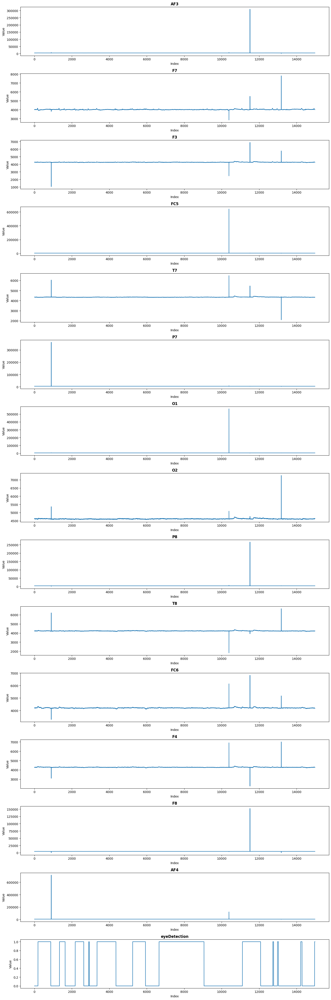

In [13]:
## SENSOR DATA EXPLORATION
num_cols = len(data.columns)
fig, axes = plt.subplots(nrows=num_cols, ncols=1, figsize=(15, 3*num_cols), sharey=False)

for i, column in enumerate(data.columns):
  ax = axes[i]
  ax.plot(data[column])
  ax.set_title(column,fontweight='bold')
  ax.set_xlabel('Index')
  ax.set_ylabel('Value')
  # ax.grid(True)

plt.tight_layout()
plt.show()

1. **Signal Patterns Across Channels:**  
   Each electrode exhibits unique signal patterns corresponding to its location and the brain regions it monitors. For instance:
   - Frontal electrodes (e.g., **AF3**, **AF4**, **F3**, **F4**) show distinct activity patterns often associated with cognitive processes, attention, and decision-making.
   - Temporal electrodes (e.g., **T7**, **T8**) and parietal electrodes (e.g., **P7**, **P8**) display signals related to sensory processing and integration.

2. **Amplitude Ranges:**  
   - The amplitude of signals varies significantly between electrodes, reflecting differences in activity across brain regions.
   - Some electrodes show higher amplitude fluctuations, possibly due to increased sensitivity to specific cognitive or physiological states, such as eye movements or blinks.

3. **Frequency Components:**  
   - Visual inspection suggests a mix of low-frequency components (e.g., delta, theta) and high-frequency components (e.g., beta, gamma). These frequencies correlate with different neural activities, such as relaxation, alertness, or task engagement.

4. **Correlations and Symmetry:**  
   - Electrodes positioned symmetrically (e.g., **T7** vs. **T8**, **AF3** vs. **AF4**) often exhibit comparable patterns, indicating hemispheric symmetry in brain activity. This observation aligns with the bilateral structure of the brain.

5. **Eye-Related Artifacts:**  
   - Electrodes near the eyes (e.g., **AF3**, **AF4**) may capture artifacts caused by eye movements or blinking. These artifacts can contribute to the distinction between eye-open and eye-closed states.


In [15]:
## STANDARD 10-20 DISTRIBUTION SYSTEM CONFIGURATION
electrode_data = {
    'Electrode': ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2'],
    'Location': [
        'Left Frontopolar', 'Right Frontopolar', 'Left Lateral Frontal', 'Left Frontal', 'Central Frontal',
        'Right Frontal', 'Right Lateral Frontal', 'Left Temporal', 'Left Central', 'Central Central',
        'Right Central', 'Right Temporal', 'Left Lateral Parietal', 'Left Parietal', 'Central Parietal',
        'Right Parietal', 'Right Lateral Parietal', 'Left Occipital', 'Right Occipital'
    ],
    'Hemisphere': [
        'Left', 'Right', 'Left', 'Left', 'Central', 'Right', 'Right', 'Left', 'Left',
        'Central', 'Right', 'Right', 'Left', 'Left', 'Central', 'Right', 'Right', 'Left', 'Right'
    ],
    'Area': [
        'Frontal', 'Frontal', 'Frontal', 'Frontal', 'Frontal', 'Frontal', 'Frontal', 'Temporal', 'Central', 'Central',
        'Central', 'Temporal', 'Parietal', 'Parietal', 'Parietal', 'Parietal', 'Parietal', 'Occipital', 'Occipital'
    ]
}

electrodes_df = pd.DataFrame(electrode_data)

display(HTML(electrodes_df.to_html(index=False)))

Electrode,Location,Hemisphere,Area
Fp1,Left Frontopolar,Left,Frontal
Fp2,Right Frontopolar,Right,Frontal
F7,Left Lateral Frontal,Left,Frontal
F3,Left Frontal,Left,Frontal
Fz,Central Frontal,Central,Frontal
F4,Right Frontal,Right,Frontal
F8,Right Lateral Frontal,Right,Frontal
T7,Left Temporal,Left,Temporal
C3,Left Central,Left,Central
Cz,Central Central,Central,Central


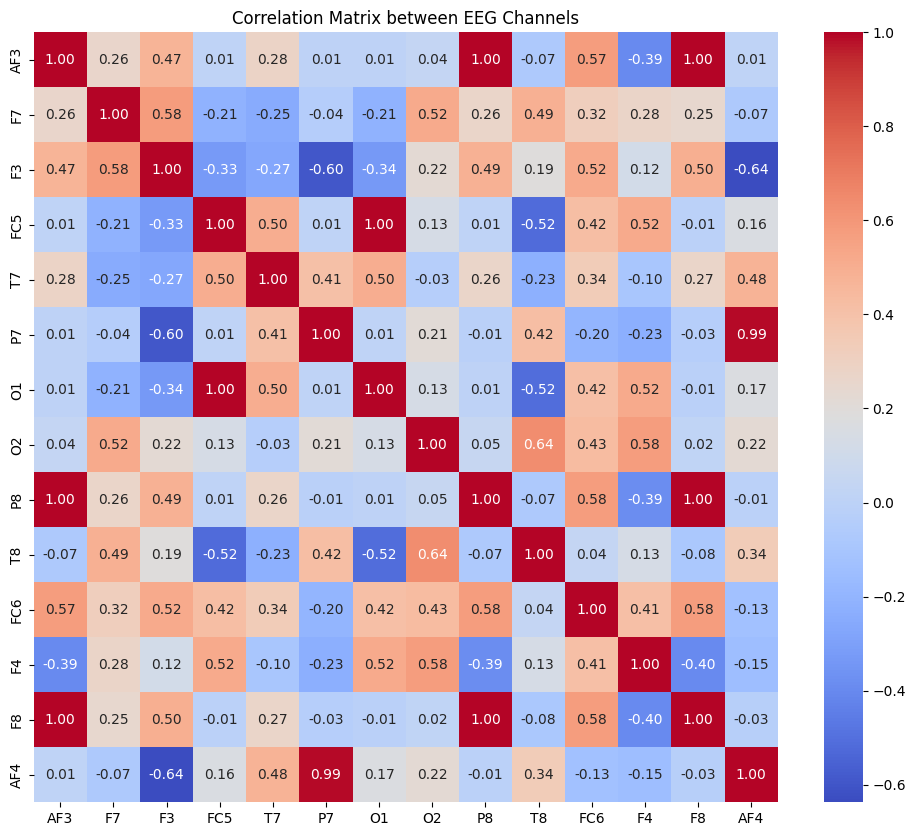

In [16]:
## CORRELATION MATRIX
correlation_matrix = data.iloc[:, :-1].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix between EEG Channels')
plt.show()

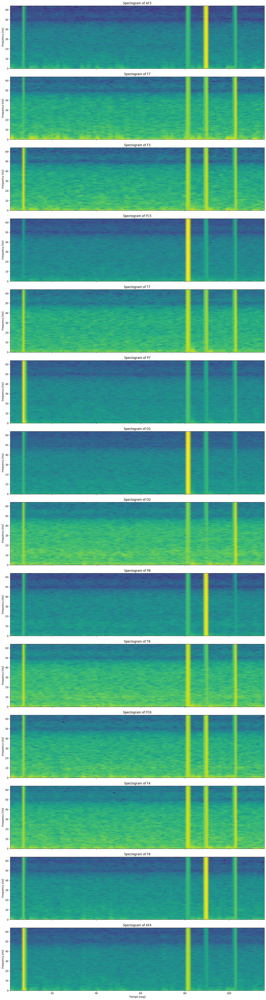

In [ ]:
## SPECTOGRAM VISUALIZATION
fs = round(data.shape[0]/117)
'''
defines the size of the window (in number of samples) used to compute the Short-Time Fourier Transform (STFT) for each segment of the signal.
A larger value of nperseg results in better frequency resolution in the spectrogram but reduces time resolution.
A smaller value of nperseg enhances time resolution but diminishes frequency resolution.
'''
nperseg = 256 

'''
defines the number of samples that overlap between consecutive windows when calculating the Short-Time Fourier Transform (STFT).
A larger value of noverlap results in a smoother spectrogram with greater redundancy, but it increases the computation time.
A smaller value of noverlap leads to a less smooth spectrogram with reduced redundancy, but it decreases the computation time.
'''
noverlap = nperseg // 2

n_channels = len(data.columns) - 1

fig, axes = plt.subplots(n_channels, 1, figsize=(15, 4 * n_channels), sharex=True)

for i, channel in enumerate(data.columns[:-1]):
    f, t, Sxx = signal.spectrogram(data[channel].values, fs, nperseg=nperseg, noverlap=noverlap)

    axes[i].pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')  # LOGARITHMIC SCALE
    axes[i].set_ylabel('Frequency [Hz]')
    axes[i].set_title(f'Spectogram of {channel}')

plt.xlabel('Tiempo [seg]')
plt.tight_layout()
plt.show()

In [17]:
## CREATING A DEEP COPY FROM THE ORIGINAL DATASET
data_mne = copy.deepcopy(data)

Creating RawArray with float64 data, n_channels=14, n_times=14980
    Range : 0 ... 14979 =      0.000 ...   117.023 secs
Ready.


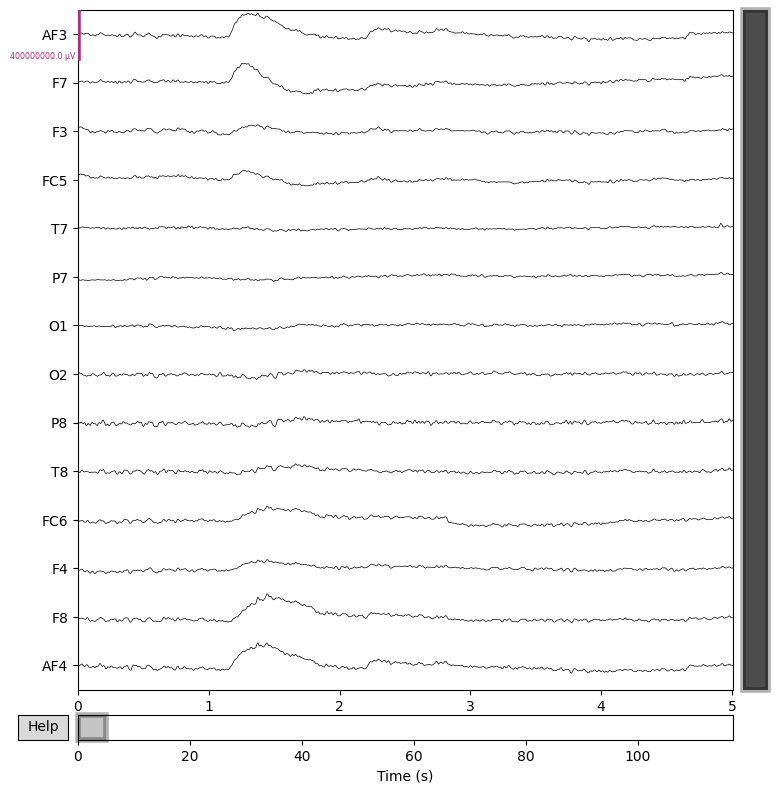

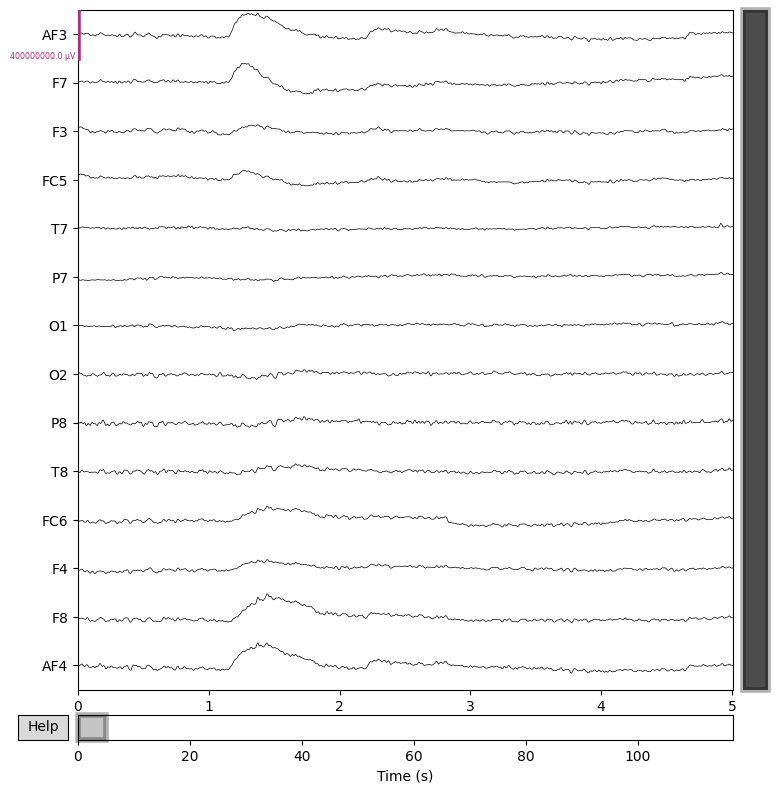

In [22]:
## CHANNEL PREPARATION
ch_names = data_mne.columns[:-1].tolist() # ELECTRODE NAMES
sfreq = round(data_mne.shape[0]/117) # SAMLING RATE
ch_types = ['eeg'] * len(ch_names)

info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)
eeg_data = data_mne.iloc[:, :-1].to_numpy().T

# RAW DATA OBJECT
raw = mne.io.RawArray(eeg_data, info)

raw.plot(duration=5, n_channels=len(ch_names), scalings={'eeg': 200}, title='EEG Raw Data')

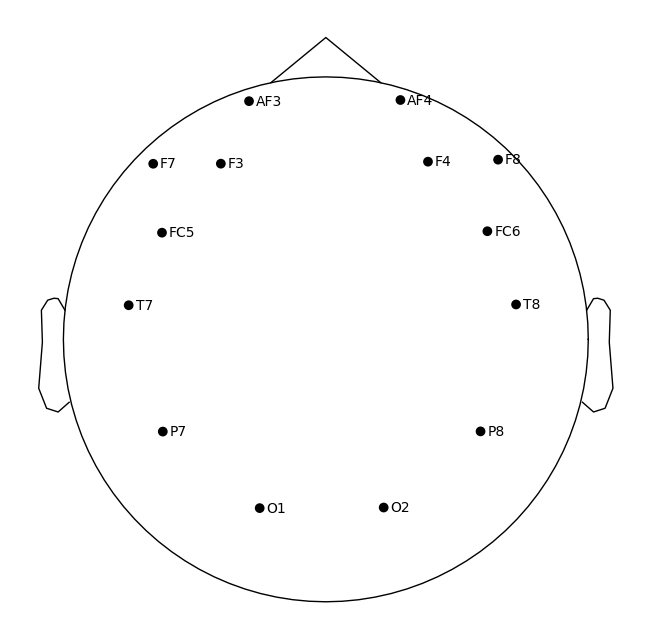

In [27]:
## STANDARD 10-20 CONFIGURATION
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

fig = raw.plot_sensors(show_names=True)
plt.show()

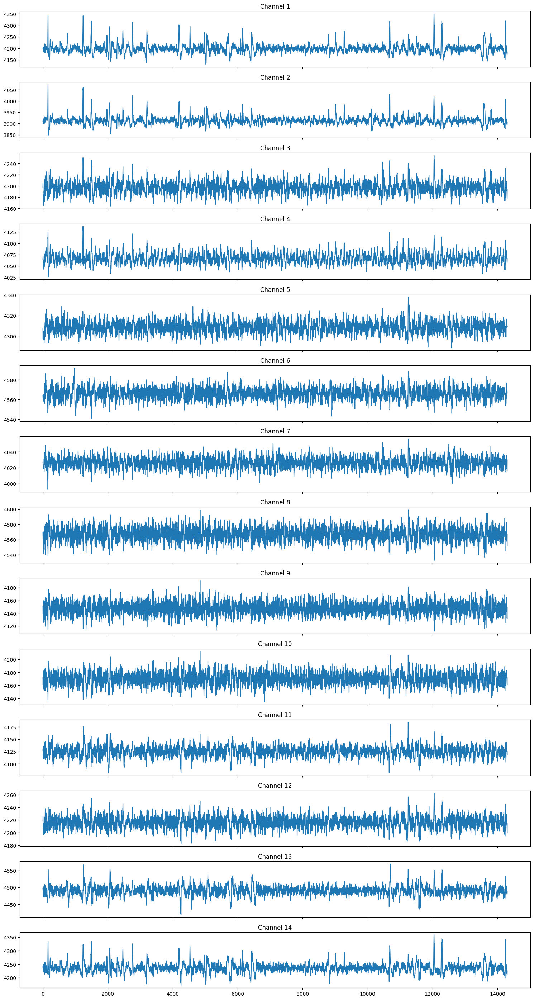

In [39]:
import numpy as np
import pandas as pd
from scipy.signal import butter, filtfilt
from matplotlib import pyplot as plt

# Function to apply bandpass filter
def bandpass_filter(data, lowcut=1.0, highcut=50.0, fs=256, order=5):
    nyquist = 0.5 * fs  # Nyquist frequency
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data, axis=0)

# Load dataset
path = 'EEG.arff'
df = load_arff(path)

# Convert all values to numeric (force non-numeric to NaN)
df = df.apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values
df.dropna(inplace=True)

# Convert back to NumPy array
values = df.values

# Outlier removal using 4-sigma rule
for i in range(values.shape[1] - 1):  # Exclude last column (labels)
    df_mean, df_std = np.mean(values[:, i]), np.std(values[:, i])
    cut_off = df_std * 4
    lower, upper = df_mean - cut_off, df_mean + cut_off

    # Filter out values outside the range
    values = values[(values[:, i] >= lower) & (values[:, i] <= upper)]

# Normalize the EEG data before filtering
min_vals = np.min(values[:, :-1], axis=0)
max_vals = np.max(values[:, :-1], axis=0)
normalized_values = (values[:, :-1] - min_vals) / (max_vals - min_vals)

# Apply bandpass filter
filtered_normalized = bandpass_filter(normalized_values)

# Rescale back to original range
filtered_values = filtered_normalized * (max_vals - min_vals) + min_vals

# Create a subplot for each time series
fig, axes = plt.subplots(filtered_values.shape[1], 1, figsize=(15, 2 * filtered_values.shape[1]), sharex=True)
for i in range(filtered_values.shape[1]):
    axes[i].plot(filtered_values[:, i])
    axes[i].set_title(f'Channel {i+1}')
plt.tight_layout()
plt.show()

# Keep labels unchanged and concatenate with filtered data
filtered_values = np.hstack((filtered_values, values[:, -1].reshape(-1, 1)))

In [ ]:
## INDEPENDENT COMPONENT ANALYSIS (ICA) EXPLORATION
high_pass_cutoff = 1.0 
raw_filtered = raw.filter(l_freq=high_pass_cutoff, h_freq=None)

ica = ICA(n_components=8, random_state=97, method='fastica', max_iter=500) # EVALUATING WITH 8 COMPONENTS
ica.fit(raw_filtered)
##TODO: plot the filtered components as signals only



##ica.plot_components(picks=range(8), show=True)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 8 components
Fitting ICA took 0.6s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=500
Fit,17 iterations on raw data (14980 samples)
ICA components,8
Available PCA components,14
Channel types,eeg
ICA components marked for exclusion,—


## Modeling Phase

In [34]:
## SPLITTING DATASET
X = data.drop('eyeDetection', axis=1)
y = data['eyeDetection']
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42,
                                                    shuffle=False) ## SHUFFLE = False TO KEEP THE DATA IN SERIES

## EVALUATION METRICS
def evaluate_model(y_true, y_pred):
  accuracy = accuracy_score(y_true, y_pred)
  precision = precision_score(y_true, y_pred)
  recall = recall_score(y_true, y_pred)
  f1 = f1_score(y_true, y_pred)
  auc = roc_auc_score(y_true, y_pred)

  print(f"Accuracy: {accuracy:.4f}")
  print(f"Precision: {precision:.4f}")
  print(f"Recall: {recall:.4f}")
  print(f"F1-score: {f1:.4f}")
  print(f"AUC: {auc:.4f}")

  return accuracy, precision, recall, f1, auc

## CONFUSION MATRIZ
def plot_confusion_matrix(y_true, y_pred, title):
  cm = confusion_matrix(y_true, y_pred)
  plt.figure(figsize=(6, 6))
  sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
  plt.title(title)
  plt.xlabel("Predicted Label")
  plt.ylabel("True Label")
  plt.show()


## ROC CURVE
def plot_roc_curve(y_true, y_pred, title):
  fpr, tpr, thresholds = roc_curve(y_true, y_pred)
  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_true, y_pred):.4f}")
  plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
  plt.title(title)
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.legend()
  plt.show()

### AUTOML H2o

In [32]:
## INITIALIZING THE CLUSTER
h2o.init(nthreads=-1)

Checking whether there is an H2O instance running at http://localhost:54321.

.... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) Client VM (build 25.361-b09, mixed mode, sharing)
  Starting server from C:\Users\Ahmed Taha\AppData\Local\Programs\Python\Python310\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\AHMEDT~1\AppData\Local\Temp\tmppyjwjkie
  JVM stdout: C:\Users\AHMEDT~1\AppData\Local\Temp\tmppyjwjkie\h2o_Ahmed_Taha_started_from_python.out
  JVM stderr: C:\Users\AHMEDT~1\AppData\Local\Temp\tmppyjwjkie\h2o_Ahmed_Taha_started_from_python.err


c:\Users\Ahmed Taha\AppData\Local\Programs\Python\Python310\lib\site-packages\h2o\backend\server.py:395: UserWarning:

  You have a 32-bit version of Java. H2O works best with 64-bit Java.
  Please download the latest 64-bit Java SE JDK from Oracle.




  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Africa/Cairo
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.6
H2O_cluster_version_age:,4 months and 15 days
H2O_cluster_name:,H2O_from_python_Ahmed_Taha_247q7t
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,247.5 Mb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"locked, healthy"


In [35]:
## PARSING INTO H20.DATAFRAME
train_h2o = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
test_h2o = h2o.H2OFrame(pd.concat([X_test, y_test], axis=1))
train_h2o['eyeDetection'] = train_h2o['eyeDetection'].asfactor() # CREATING CATEGORIES
test_h2o['eyeDetection'] = test_h2o['eyeDetection'].asfactor() # CREATING CATEGORIES
# LABEL AND PREDICTORS
y = 'eyeDetection'
x = list(X_train.columns)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [36]:
## STARTING AUTOML
aml = H2OAutoML(max_runtime_secs = 400,
                max_models = 3,
                stopping_rounds = 5,
                stopping_metric = "logloss",
                nfolds = 10,
                seed = 42,
                verbosity='info')
aml.train(x = x,
           y = y,
           training_frame = train_h2o)

AutoML progress: |
01:24:05.720: Project: AutoML_1_20250318_12405
01:24:05.722: Setting stopping tolerance adaptively based on the training frame: 0.00913480119052337
01:24:05.722: Build control seed: 42
01:24:05.722: training frame: Frame key: AutoML_1_20250318_12405_training_py_1_sid_bb28    cols: 15    rows: 11984  chunks: 1    size: 674400  checksum: -3133043409292730736
01:24:05.722: validation frame: NULL
01:24:05.722: leaderboard frame: NULL
01:24:05.723: blending frame: NULL
01:24:05.723: response column: eyeDetection
01:24:05.723: fold column: null
01:24:05.723: weights column: null
01:24:05.746: AutoML: XGBoost is not available; skipping it.
01:24:05.753: Loading execution steps: [{XGBoost : [def_2 (1g, 10w), def_1 (2g, 10w), def_3 (3g, 10w), grid_1 (4g, 90w), lr_search (7g, 30w)]}, {GLM : [def_1 (1g, 10w)]}, {DRF : [def_1 (2g, 10w), XRT (3g, 10w)]}, {GBM : [def_5 (1g, 10w), def_2 (2g, 10w), def_3 (2g, 10w), def_4 (2g, 10w), def_1 (3g, 10w), grid_1 (4g, 60w), lr_annealing (7g

key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/3
# GBM base models (used / total),1/1
# DRF base models (used / total),1/1
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,10
Metalearner fold_column,None
Custom metalearner hyperparameters,None


In [40]:
## LEADERBOARD OF MODELS
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20250318_12405,0.993954,0.0975328,0.994886,0.0353312,0.166406,0.0276908
GBM_1_AutoML_1_20250318_12405,0.993924,0.0977167,0.994847,0.0351832,0.166352,0.027673
DRF_1_AutoML_1_20250318_12405,0.984849,0.301883,0.987571,0.0626855,0.284496,0.0809382
GLM_1_AutoML_1_20250318_12405,0.676735,0.644315,0.691875,0.414649,0.475846,0.226429


In [41]:
## OBTAINING THE BEST MODEL PARAMETERS
best_model = aml.leader

In [42]:
## EXTRACTING THE BEST MODEL PARAMETERS
model_params = best_model.params
print(model_params)

{'model_id': {'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'StackedEnsemble_BestOfFamily_1_AutoML_1_20250318_12405', 'type': 'Key<Model>', 'URL': '/3/Models/StackedEnsemble_BestOfFamily_1_AutoML_1_20250318_12405'}, 'input': None}, 'training_frame': {'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20250318_12405_training_py_1_sid_bb28', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20250318_12405_training_py_1_sid_bb28'}, 'input': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20250318_12405_training_py_1_sid_bb28', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20250318_12405_training_py_1_sid_bb28'}}, 'response_column': {'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'ColSpecifierV3', 'schema_type': 'VecSpecifier'}, 'colum

In [43]:
## EXPORTING THE BEST MODEL
model_path = h2o.save_model(model=best_model, path="/tmp/mymodel", force=True)
print(f"SAVED IN: {model_path}")

SAVED IN: C:\tmp\mymodel\StackedEnsemble_BestOfFamily_1_AutoML_1_20250318_12405


#### Evaluating H2o model

In [45]:
## TRAIN SET PREDICTION
train_predictions_h2o = best_model.predict(train_h2o)
train_predictions_h2o = train_predictions_h2o['predict'].as_data_frame().values.ravel()

## TEST SET PREDICTIONS
test_predictions_h2o = best_model.predict(test_h2o)
test_predictions_h2o = test_predictions_h2o['predict'].as_data_frame().values.ravel()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\Ahmed Taha\AppData\Local\Programs\Python\Python310\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)




stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\Ahmed Taha\AppData\Local\Programs\Python\Python310\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning:

Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)




In [46]:
## RESULTS  TRAIN
print("TRAIN SET METRICS:")
train_metrics_h2o = evaluate_model(y_train, train_predictions_h2o)

TRAIN SET METRICS:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1-score: 1.0000
AUC: 1.0000


In [47]:
## RESULTS TEST
print("TEST SET METRICS:")
test_metrics_h2o = evaluate_model(y_test, test_predictions_h2o)

TEST SET METRICS:
Accuracy: 0.5160
Precision: 0.1191
Recall: 0.6536
F1-score: 0.2015
AUC: 0.5777


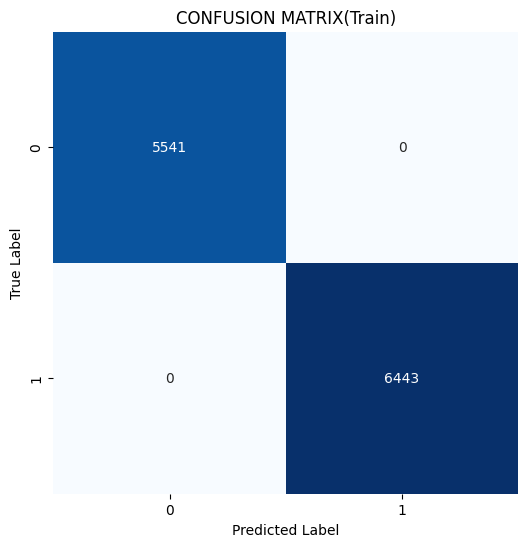

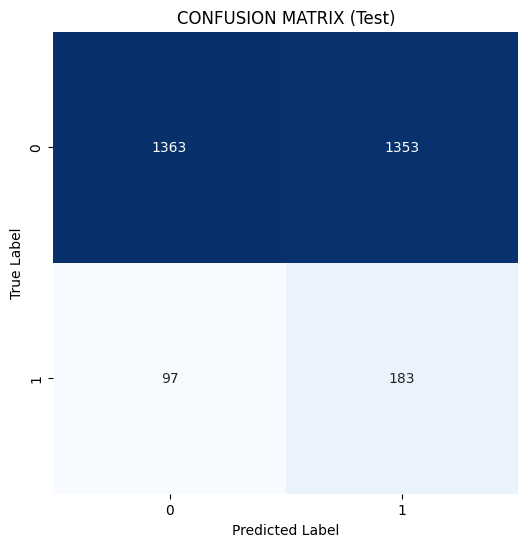

In [48]:
## CONFUSION MATRIX
plot_confusion_matrix(y_train, train_predictions_h2o, "CONFUSION MATRIX(Train)")
plot_confusion_matrix(y_test, test_predictions_h2o, "CONFUSION MATRIX (Test)")

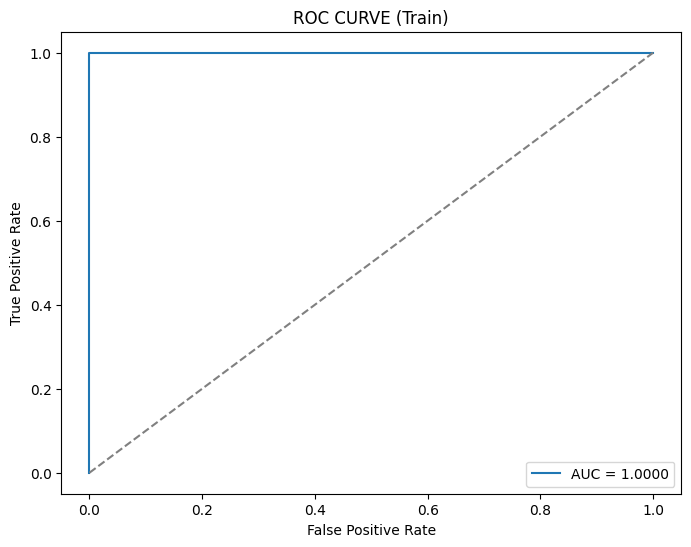

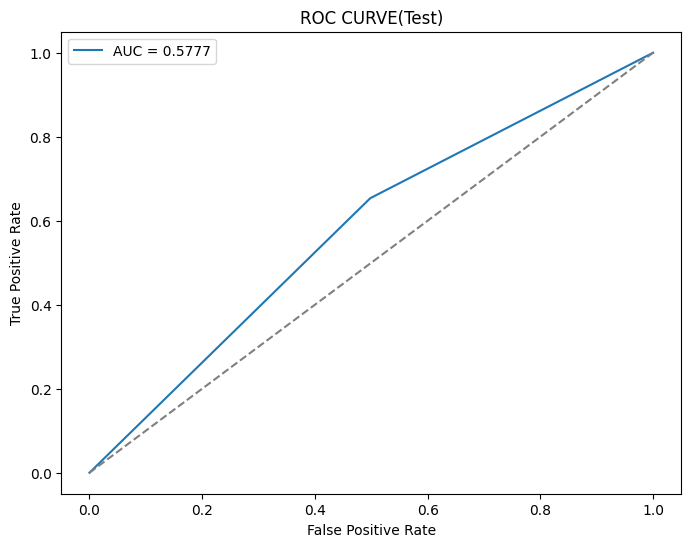

In [49]:
## ROC CURVE
plot_roc_curve(y_train, train_predictions_h2o, "ROC CURVE (Train)")
plot_roc_curve(y_test, test_predictions_h2o, "ROC CURVE(Test)")

### AUTOGLUON

In [50]:
# ADJUSTING THE DATASET WITH THE EXPECTED FORMAT
train_data_with_label = pd.concat([X_train, y_train], axis=1)
train_data_with_label.reset_index(drop=True, inplace=True)

In [51]:
# TRAINING THE MODEL VIA PIPELINE
predictor = TabularPredictor(label='eyeDetection')
predictor.fit(train_data=train_data_with_label)

No path specified. Models will be saved in: "AutogluonModels\ag-20250317_234803"
Verbosity: 2 (Standard Logging)


=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.10.8
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.26100
CPU Count:          8
Memory Avail:       0.81 GB / 7.70 GB (10.5%)
Disk Space Avail:   78.60 GB / 453.36 GB (17.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. Recommended for most users. Use in competitions and benchmarks.
	presets='high'         : Strong accuracy with fast inference speed.
	presets='good'         : Good accuracy with very fast inference speed.

[1000]	valid_set's binary_error: 0.0667223
[2000]	valid_set's binary_error: 0.0533778
[3000]	valid_set's binary_error: 0.0467056
[4000]	valid_set's binary_error: 0.0442035
[5000]	valid_set's binary_error: 0.0408674
[6000]	valid_set's binary_error: 0.0408674
[7000]	valid_set's binary_error: 0.0391993


	0.9616	 = Validation score   (accuracy)
	24.45s	 = Training   runtime
	0.43s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's binary_error: 0.0316931


	0.9691	 = Validation score   (accuracy)
	6.05s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: RandomForestGini ...
	0.9441	 = Validation score   (accuracy)
	3.37s	 = Training   runtime
	0.34s	 = Validation runtime
Fitting model: RandomForestEntr ...
	0.945	 = Validation score   (accuracy)
	3.7s	 = Training   runtime
	0.23s	 = Validation runtime
Fitting model: CatBoost ...
	0.9658	 = Validation score   (accuracy)
	38.26s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesGini ...
	0.9591	 = Validation score   (accuracy)
	2.82s	 = Training   runtime
	0.27s	 = Validation runtime
Fitting model: ExtraTreesEntr ...
	0.9566	 = Validation score   (accuracy)
	2.55s	 = Training   runtime
	0.39s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	0.7098	 = Validation score   (accuracy)
	28.67s	 = Training   runtime
	0.06s	 = Validation runtime
Fitting model: XGBoost ...
	0.9625	 = Validation score   (accuracy)
	8.96s	 = Training   runtime
	0.02s	

#### Evaluating AutoGluon

AutoGluon - TRAIN SET METRICS:
Accuracy: 0.9996
Precision: 0.9997
Recall: 0.9995
F1-score: 0.9996
AUC: 0.9996


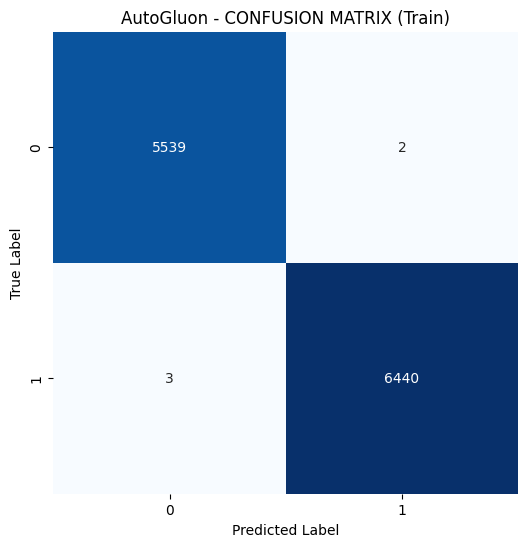

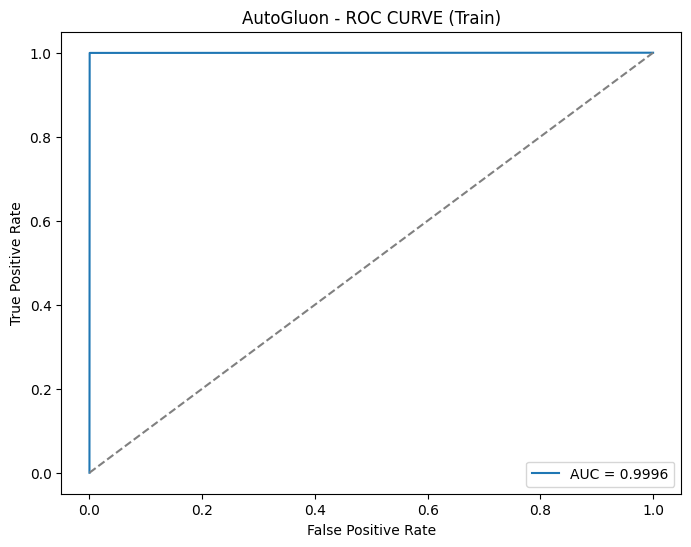

AutoGluon - TEST SET METRICS:
Accuracy: 0.4800
Precision: 0.1183
Recall: 0.7071
F1-score: 0.2027
AUC: 0.5818


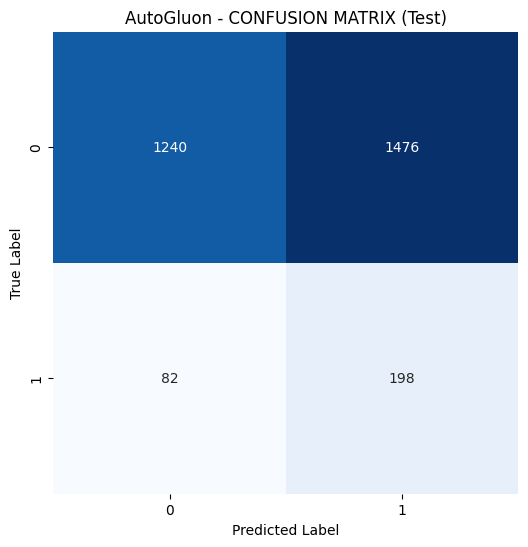

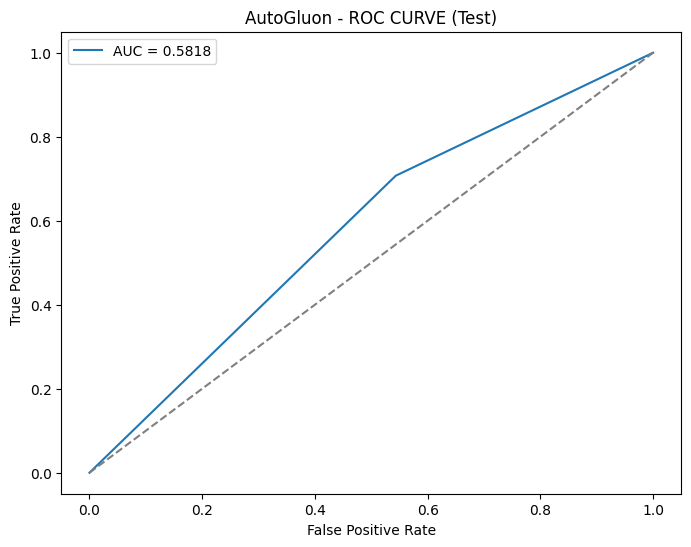

In [57]:
## PREDICTIONS
train_predictions_ag = predictor.predict(X_train)
test_predictions_ag = predictor.predict(X_test)

print("AutoGluon - TRAIN SET METRICS:")
train_metrics_ag = evaluate_model(y_train, train_predictions_ag)
plot_confusion_matrix(y_train, train_predictions_ag, "AutoGluon - CONFUSION MATRIX (Train)")
plot_roc_curve(y_train, train_predictions_ag, "AutoGluon - ROC CURVE (Train)")

print("AutoGluon - TEST SET METRICS:")
test_metrics_ag = evaluate_model(y_test, test_predictions_ag)
plot_confusion_matrix(y_test, test_predictions_ag, "AutoGluon - CONFUSION MATRIX (Test)")
plot_roc_curve(y_test, test_predictions_ag, "AutoGluon - ROC CURVE (Test)")

# Use X_test as the test dataset
predictions = predictor.predict(X_test)
results = X_test.copy()
results['Predictions'] = predictions

# Save results to an Excel file
results.to_excel('autogluon_results.xlsx', index=False)

### TPOT

In [ ]:
# TRAINING THE MODEL
tpot = TPOTClassifier(generations=5, population_size=50, random_state=42, n_jobs=-1)
tpot.fit(X_train, y_train, verbosity=2)

#### Evaluating TPOT

TPOT - TRAIN SET METRICS:
Accuracy: 0.8330
Precision: 0.8398
Recall: 0.8519
F1-score: 0.8458
AUC: 0.8315


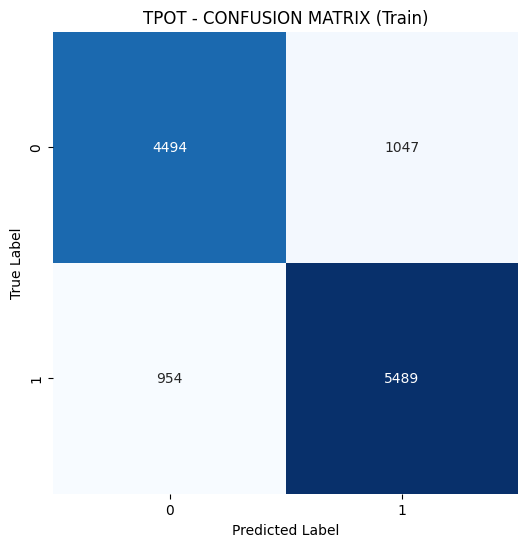

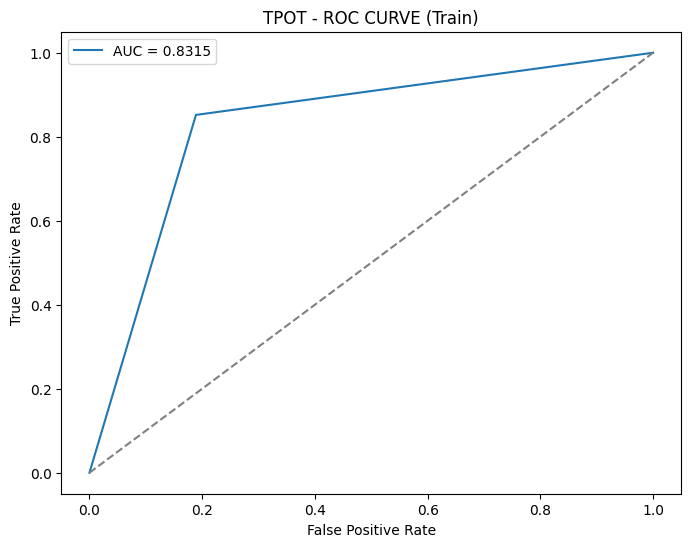

TPOT - TEST SET METRICS:
Accuracy: 0.4166
Precision: 0.0989
Recall: 0.6464
F1-score: 0.1716
AUC: 0.5196


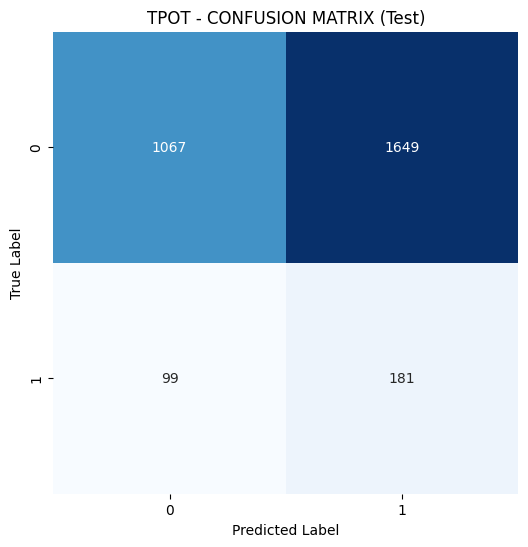

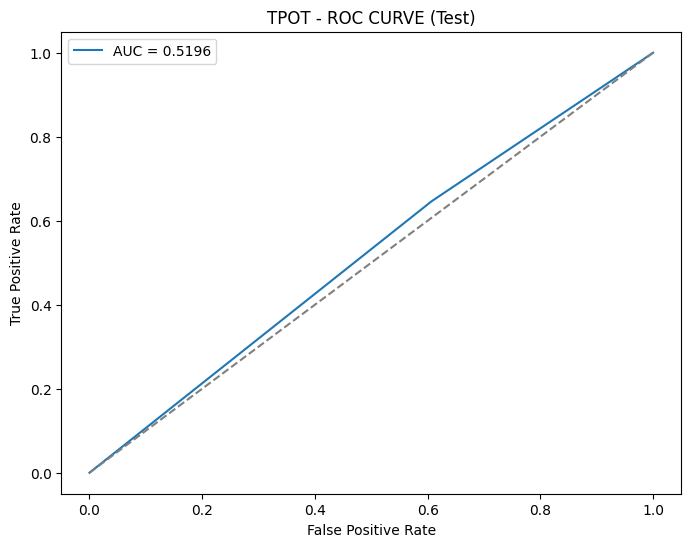

In [37]:
## PREDICTIONS
train_predictions_tpot = tpot.predict(X_train)
test_predictions_tpot = tpot.predict(X_test)

print("TPOT - TRAIN SET METRICS:")
train_metrics_tpot = evaluate_model(y_train, train_predictions_tpot)
plot_confusion_matrix(y_train, train_predictions_tpot, "TPOT - CONFUSION MATRIX (Train)")
plot_roc_curve(y_train, train_predictions_tpot, "TPOT - ROC CURVE (Train)")

print("TPOT - TEST SET METRICS:")
test_metrics_tpot = evaluate_model(y_test, test_predictions_tpot)
plot_confusion_matrix(y_test, test_predictions_tpot, "TPOT - CONFUSION MATRIX (Test)")
plot_roc_curve(y_test, test_predictions_tpot, "TPOT - ROC CURVE (Test)")

## Metrics Comparison

In [38]:
data = {
    'Métrica': ['Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC'],
    'H2O (Train)': train_metrics_h2o,
    'H2O (Test)': test_metrics_h2o,
    'AutoGluon (Train)': train_metrics_ag,
    'AutoGluon (Test)': test_metrics_ag,
    'TPOT (Train)': train_metrics_tpot,
    'TPOT (Test)': test_metrics_tpot
}

comparison_table = pd.DataFrame(data)

comparison_table

,Métrica,H2O (Train),H2O (Test),AutoGluon (Train),AutoGluon (Test),TPOT (Train),TPOT (Test)
0,Accuracy,1.0,0.657210,0.999332,0.459279,0.833027,0.416555
1,Precision,1.0,0.133464,0.999224,0.118451,0.839810,0.098907
2,Recall,1.0,0.485714,0.999534,0.742857,0.851932,0.646429
3,F1-score,1.0,0.209392,0.999379,0.204322,0.845828,0.171564
4,AUC,1.0,0.580302,0.999316,0.586451,0.831489,0.519643


### **1. Accuracy**
- **H2O (Train):** 1.0  
  - H2O achieves perfect accuracy on the training set, indicating it has learned the training data perfectly.
- **H2O (Test):** 0.6572  
  - Accuracy drops significantly on the test set, signaling overfitting. The model struggles to generalize to unseen data.
- **AutoGluon (Train):** 0.9993  
  - AutoGluon also achieves near-perfect accuracy on the training set, demonstrating excellent fit to the training data.
- **AutoGluon (Test):** 0.4593  
  - The drop in accuracy on the test set is substantial, similar to H2O, pointing to overfitting issues.
- **TPOT (Train):** 0.8330  
  - TPOT shows moderate accuracy on the training set, performing well, but not as perfectly as H2O or AutoGluon.
- **TPOT (Test):** 0.4166  
  - Similar to the other models, TPOT's accuracy on the test set is low, further confirming its struggle to generalize.

---

### **2. Precision**
- **H2O (Train):** 1.0  
  - Precision is perfect on the training set, meaning H2O never makes a false positive on the training data.
- **H2O (Test):** 0.1335  
  - Precision drops drastically on the test set, indicating many false positives and a poor performance in distinguishing the minority class (eye-closed).
- **AutoGluon (Train):** 0.9992  
  - AutoGluon also has near-perfect precision on the training set, showing it is excellent at avoiding false positives.
- **AutoGluon (Test):** 0.1185  
  - Precision is low on the test set, suggesting AutoGluon, like H2O, suffers from many false positives when generalizing to new data.
- **TPOT (Train):** 0.8398  
  - TPOT achieves a good precision score on the training set, but not perfect, showing more balance in its predictions compared to the other models.
- **TPOT (Test):** 0.0989  
  - Precision drops significantly on the test set, meaning TPOT makes many incorrect predictions, especially in terms of false positives.

---

### **3. Recall**
- **H2O (Train):** 1.0  
  - H2O has perfect recall on the training set, correctly identifying all instances of both classes.
- **H2O (Test):** 0.4857  
  - Recall drops substantially on the test set, meaning H2O misses many true positive instances on the unseen data, likely due to overfitting.
- **AutoGluon (Train):** 0.9995  
  - AutoGluon performs almost perfectly in recall on the training set, identifying nearly all true positive instances.
- **AutoGluon (Test):** 0.7429  
  - Recall on the test set is high, indicating AutoGluon can generalize well and identify most true positives, better than H2O.
- **TPOT (Train):** 0.8519  
  - TPOT shows a good recall on the training set, correctly identifying many true positive instances.
- **TPOT (Test):** 0.6464  
  - Recall on the test set is still decent, showing that TPOT can identify a significant portion of true positives despite the overfitting.

---

### **4. F1-score**
- **H2O (Train):** 1.0  
  - The F1-score is perfect on the training set, as both precision and recall are high.
- **H2O (Test):** 0.2094  
  - The F1-score drops dramatically on the test set, indicating a poor balance between precision and recall.
- **AutoGluon (Train):** 0.9994  
  - AutoGluon’s F1-score on the training set is near-perfect, showing excellent balance between precision and recall.
- **AutoGluon (Test):** 0.2043  
  - The F1-score on the test set is low, showing that AutoGluon struggles with generalization and maintaining a good precision-recall balance.
- **TPOT (Train):** 0.8458  
  - TPOT achieves a strong F1-score on the training set, reflecting a good balance between precision and recall.
- **TPOT (Test):** 0.1716  
  - The F1-score drops significantly on the test set, indicating poor performance due to a lack of balance between false positives and false negatives.

---

### **5. AUC (Area Under the Curve)**
- **H2O (Train):** 1.0  
  - H2O achieves perfect AUC on the training set, indicating excellent class discrimination.
- **H2O (Test):** 0.5803  
  - A significant drop in AUC on the test set, suggesting H2O struggles to distinguish between classes on unseen data.
- **AutoGluon (Train):** 0.9993  
  - AutoGluon shows excellent AUC on the training set, similar to H2O, indicating high discriminative ability.
- **AutoGluon (Test):** 0.5865  
  - The AUC on the test set is still good, but it drops compared to the training set, reflecting weaker class discrimination on unseen data.
- **TPOT (Train):** 0.8315  
  - TPOT’s AUC on the training set is solid, showing moderate ability to distinguish between the two classes.
- **TPOT (Test):** 0.5196  
  - The AUC on the test set is low, further confirming TPOT's struggle with classification on unseen data.

---

### **Conclusion**
- **Overfitting:** All three models (H2O, AutoGluon, and TPOT) show signs of overfitting. They perform well on the training set but fail to generalize to the test set, as seen by the sharp drop in performance across all metrics.
- **Precision vs. Recall Tradeoff:** Models generally perform well in recall on the training set, but their precision on the test set is much lower, indicating a significant number of false positive predictions.
- **Model Comparisons:** **AutoGluon** stands out with the best recall and a relatively smaller drop in performance compared to H2O and TPOT. However, all models show limitations in generalization, especially with precision.



In [58]:
## CLOSING THE CLUSTER
h2o.cluster().shutdown()

H2O session _sid_bb28 closed.
